**Data scraping coinmarketcap:**

In [541]:
from coinmarketcap import Market
coinmarketcap = Market()
import coinmarketcap
import jsonc
import pandas as pd
import time
import requests
from bs4 import BeautifulSoup
import requests
import numpy as np
!pip install xmltodict
!pip install beautifulsoup4
import numpy as np
import json
import pandas as pd
import time
import requests
from bs4 import BeautifulSoup
import requests
import xmltodict
import  seaborn as sns
from sklearn.model_selection import KFold
from sklearn.linear_model import Lasso
from sklearn.metrics import mean_absolute_error as mae, mean_squared_error as mse
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.formula.api as smf # module for various regression models
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import  KNeighborsClassifier
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error as mae, mean_squared_error as mse
from sklearn.model_selection import KFold
from sklearn.linear_model import Lasso

sns.set()

%matplotlib inline

In [448]:
base_url = 'https://coinmarketcap.com/all/views/all'
response = requests.get(base_url)

In [449]:
response #hvis 200 så virkede det..

<Response [200]>

In [364]:
response.content

b'<!DOCTYPE html>\n<!--[if lt IE 7]>      <html class="no-js lt-ie9 lt-ie8 lt-ie7"> <![endif]-->\n<!--[if IE 7]>         <html class="no-js lt-ie9 lt-ie8"> <![endif]-->\n<!--[if IE 8]>         <html class="no-js lt-ie9"> <![endif]-->\n<!--[if gt IE 8]><!--> \n<html class="no-js"> <!--<![endif]-->\n    <head>\n        <title>\n     All Currencies  | CryptoCurrency Market Capitalizations\n</title>\n        \n        <meta charset="utf-8" />\n        <meta name="viewport" content="width=device-width, initial-scale=1.0" />        \n        <meta name="google-site-verification" content="EDc1reqlQ-zAgeRrrgAxRXNK-Zs9JgpE9a0wdaoSO9A" />\n        <meta property="og:type" content="website" />\n        <meta property="og:image:type" content="image/png" />\n        <meta property="og:image:width" content="200" />\n        <meta property="og:image:height" content="200" />\n        \n        <meta property="og:image" content="http://coinmarketcap.com/static/img/CoinMarketCap.png" />\n        <meta p

In [365]:
data1 = BeautifulSoup(response.text, "lxml")

In [366]:
data1

<!DOCTYPE html>
<!--[if lt IE 7]>      <html class="no-js lt-ie9 lt-ie8 lt-ie7"> <![endif]--><!--[if IE 7]>         <html class="no-js lt-ie9 lt-ie8"> <![endif]--><!--[if IE 8]>         <html class="no-js lt-ie9"> <![endif]--><!--[if gt IE 8]><!--><html class="no-js"> <!--<![endif]-->
<head>
<title>
     All Currencies  | CryptoCurrency Market Capitalizations
</title>
<meta charset="utf-8"/>
<meta content="width=device-width, initial-scale=1.0" name="viewport"/>
<meta content="EDc1reqlQ-zAgeRrrgAxRXNK-Zs9JgpE9a0wdaoSO9A" name="google-site-verification"/>
<meta content="website" property="og:type"/>
<meta content="image/png" property="og:image:type"/>
<meta content="200" property="og:image:width"/>
<meta content="200" property="og:image:height"/>
<meta content="http://coinmarketcap.com/static/img/CoinMarketCap.png" property="og:image"/>
<meta content="https://coinmarketcap.com/static/img/CoinMarketCap.png" property="og:image:secure_url"/>
<meta content="CryptoCurrency Market Capitalizat

In [333]:
#print(data1.prettify())

In [85]:
?data1.find

In [367]:
investigator_links = data1.findAll("td", {'class': 'no-wrap currency-name'}) #alle crypto-valuta/assets
#og de tilhørende links der skal tilføjes til base_url

In [368]:
investigator_links[0] #alle de andre burde være der også ;)

<td class="no-wrap currency-name">
<img alt="Bitcoin" class="currency-logo" src="https://files.coinmarketcap.com/static/img/coins/16x16/bitcoin.png"/>
<a href="/currencies/bitcoin/">Bitcoin</a>
</td>

# Looking at what I get for the first element (bitcoin)

In [369]:
inv_list_link_btc = investigator_list[0]
print(inv_list_btc.prettify())

<td class="no-wrap currency-name">
 <img alt="Bitcoin" class="currency-logo" src="https://files.coinmarketcap.com/static/img/coins/16x16/bitcoin.png"/>
 <a href="/currencies/bitcoin/">
  Bitcoin
 </a>
</td>



In [370]:
print(list(inv_list_link_btc.children))

['\n', <img alt="Bitcoin" class="currency-logo" src="https://files.coinmarketcap.com/static/img/coins/16x16/bitcoin.png"/>, '\n', <a href="/currencies/bitcoin/">Bitcoin</a>, '\n']


In [371]:
print(list(inv_list_link_btc.descendants))

['\n', <img alt="Bitcoin" class="currency-logo" src="https://files.coinmarketcap.com/static/img/coins/16x16/bitcoin.png"/>, '\n', <a href="/currencies/bitcoin/">Bitcoin</a>, 'Bitcoin', '\n']


In [372]:
extension_link = inv_list_link_btc.a['href'] # grabbing the link extension to the base_url
print(extension_link)

/currencies/bitcoin/


In [374]:
#Nu tager vi alle links som skal tilføjes til base_url linket
investigator_links_finished = []
for links in (investigator_links):
    investigator_link_finished = base_url + links.a['href']
    investigator_links_finished.append(investigator_link_finished)

In [395]:
len(investigator_links_finished),print(investigator_links_finished[0]), investigator_links_finished[-10:] # Antal stemme 1052 som er det
#korrekte antal cryptocurrencies/assets på coinbase og viser btc (den første) og de sidste 10 stk.

https://coinmarketcap.com/all/views/all/currencies/bitcoin/historical-data/


(1052,
 None,
 ['https://coinmarketcap.com/all/views/all/currencies/international-diamond/historical-data/',
  'https://coinmarketcap.com/all/views/all/currencies/bitcentavo/historical-data/',
  'https://coinmarketcap.com/all/views/all/currencies/elcoin/historical-data/',
  'https://coinmarketcap.com/all/views/all/currencies/pinkdog/historical-data/',
  'https://coinmarketcap.com/all/views/all/currencies/bongger/historical-data/',
  'https://coinmarketcap.com/all/views/all/currencies/ivugeocoin/historical-data/',
  'https://coinmarketcap.com/all/views/all/currencies/turbocoin/historical-data/',
  'https://coinmarketcap.com/all/views/all/assets/president-clinton/historical-data/',
  'https://coinmarketcap.com/all/views/all/currencies/true-investment-coin/historical-data/',
  'https://coinmarketcap.com/all/views/all/currencies/microcoin/historical-data/'])

# adding the historical data links for each currency/asset: 

In [431]:
investigator_links_finished = []
for links in (investigator_links):
    investigator_link_finished = base_url + links.a['href'] + "historical-data/"
    investigator_links_finished.append(investigator_link_finished)

In [432]:
len(investigator_links_finished) #the number is korrekt

1052

In [433]:
print(investigator_links_finished[0]),investigator_links_finished[1:20]
#first and last currency/asset og når man klikker

https://coinmarketcap.com/all/views/all/currencies/bitcoin/historical-data/


(None,
 ['https://coinmarketcap.com/all/views/all/currencies/ethereum/historical-data/',
  'https://coinmarketcap.com/all/views/all/currencies/ripple/historical-data/',
  'https://coinmarketcap.com/all/views/all/currencies/bitcoin-cash/historical-data/',
  'https://coinmarketcap.com/all/views/all/currencies/neo/historical-data/',
  'https://coinmarketcap.com/all/views/all/currencies/nem/historical-data/',
  'https://coinmarketcap.com/all/views/all/currencies/litecoin/historical-data/',
  'https://coinmarketcap.com/all/views/all/currencies/iota/historical-data/',
  'https://coinmarketcap.com/all/views/all/currencies/dash/historical-data/',
  'https://coinmarketcap.com/all/views/all/currencies/ethereum-classic/historical-data/',
  'https://coinmarketcap.com/all/views/all/assets/qtum/historical-data/',
  'https://coinmarketcap.com/all/views/all/currencies/monero/historical-data/',
  'https://coinmarketcap.com/all/views/all/assets/omisego/historical-data/',
  'https://coinmarketcap.com/all

In [ ]:
# Det ses her at "/all/veiw/all" skal slettes i alle tilfælde for at ramme det korrekte link hvor 
# det historiske data ligger..

# deleting "/all/veiw/all"

In [437]:
investigator_links_finished_new = []
for links in (investigator_links):
    link = (investigator_links_finished)[:25] + (investigator_links_finished)[39:]
    investigator_links_finished_new.append(link)

In [442]:
new_links = [w.replace('/all/views/all', '') for w in investigator_links_finished]

In [459]:
print(new_links[0]),print(new_links[1]),new_links[1020:1052]

https://coinmarketcap.com/currencies/bitcoin/historical-data/
https://coinmarketcap.com/currencies/ethereum/historical-data/


(None,
 None,
 ['https://coinmarketcap.com/currencies/goldmaxcoin/historical-data/',
  'https://coinmarketcap.com/currencies/eggcoin/historical-data/',
  'https://coinmarketcap.com/currencies/lathaan/historical-data/',
  'https://coinmarketcap.com/currencies/xde-ii/historical-data/',
  'https://coinmarketcap.com/currencies/karmacoin/historical-data/',
  'https://coinmarketcap.com/currencies/the-vegan-initiative/historical-data/',
  'https://coinmarketcap.com/currencies/quotient/historical-data/',
  'https://coinmarketcap.com/currencies/deltacredits/historical-data/',
  'https://coinmarketcap.com/currencies/teamup/historical-data/',
  'https://coinmarketcap.com/currencies/rcoin/historical-data/',
  'https://coinmarketcap.com/currencies/shellcoin/historical-data/',
  'https://coinmarketcap.com/currencies/ocow/historical-data/',
  'https://coinmarketcap.com/currencies/gameleaguecoin/historical-data/',
  'https://coinmarketcap.com/currencies/axiom/historical-data/',
  'https://coinmarketca

# Adding to the links to specify that we want all the data back to the first day where you could view historical data on coinmarketcap:

In [ ]:
newest_links = [w.replace('/all/views/all', '') for w in investigator_links_finished]

In [484]:
# ?start=20130428&end=20170815 should be added to the links to get the data from
#first to the last day of historical data.
import time
## yyyy/mm/dd format as in the link to historical data. And 20130428 is the first date.
today = str(time.strftime("%Y%m%d"))
add1 = '?start=20130428&end='

newest_links = [links + add1 + today for links in new_links]

print(newest_links[0])
print(newest_links[1051])
newest_links #nu skulle linkene være klare til at tage data fra.


https://coinmarketcap.com/currencies/bitcoin/historical-data/?start=20130428&end=20170815
https://coinmarketcap.com/currencies/microcoin/historical-data/?start=20130428&end=20170815


['https://coinmarketcap.com/currencies/bitcoin/historical-data/?start=20130428&end=20170815',
 'https://coinmarketcap.com/currencies/ethereum/historical-data/?start=20130428&end=20170815',
 'https://coinmarketcap.com/currencies/ripple/historical-data/?start=20130428&end=20170815',
 'https://coinmarketcap.com/currencies/bitcoin-cash/historical-data/?start=20130428&end=20170815',
 'https://coinmarketcap.com/currencies/neo/historical-data/?start=20130428&end=20170815',
 'https://coinmarketcap.com/currencies/nem/historical-data/?start=20130428&end=20170815',
 'https://coinmarketcap.com/currencies/litecoin/historical-data/?start=20130428&end=20170815',
 'https://coinmarketcap.com/currencies/iota/historical-data/?start=20130428&end=20170815',
 'https://coinmarketcap.com/currencies/dash/historical-data/?start=20130428&end=20170815',
 'https://coinmarketcap.com/currencies/ethereum-classic/historical-data/?start=20130428&end=20170815',
 'https://coinmarketcap.com/assets/qtum/historical-data/?st

# Now we have to take the data from these links, starting by just taking the bitcoin data, and when taking the data from all currencies remember to set a time'er, so we don't hit coinmarketcap too hard

In [486]:
last_url_bitcoin = newest_links[0]
new_response = requests.get(last_url_bitcoin)

In [487]:
new_response

<Response [200]>

In [488]:
new_data = BeautifulSoup(new_response.text, "lxml")

In [502]:
investigator_dates = new_data.findAll("td", {'class': 'text-left'}) 
investigator_data[0:10]

[<td class="text-left">Aug 14, 2017</td>,
 <td class="text-left">Aug 13, 2017</td>,
 <td class="text-left">Aug 12, 2017</td>,
 <td class="text-left">Aug 11, 2017</td>,
 <td class="text-left">Aug 10, 2017</td>,
 <td class="text-left">Aug 09, 2017</td>,
 <td class="text-left">Aug 08, 2017</td>,
 <td class="text-left">Aug 07, 2017</td>,
 <td class="text-left">Aug 06, 2017</td>,
 <td class="text-left">Aug 05, 2017</td>]

In [518]:
new_dates = []
for td in investigator_dates:
    link1234 = td.get_text()
    new_dates.append(link1234)
print(len(new_dates))
print(1570*6) #and later on we should get 9420 table elements
new_dates[0:10] # Now we have all the dates

1570
9420


['Aug 14, 2017',
 'Aug 13, 2017',
 'Aug 12, 2017',
 'Aug 11, 2017',
 'Aug 10, 2017',
 'Aug 09, 2017',
 'Aug 08, 2017',
 'Aug 07, 2017',
 'Aug 06, 2017',
 'Aug 05, 2017']

In [524]:
investigator_data = (new_data.findAll("td", {'class': None}))
print(len(investigator_data[:]))
investigator_data[9419] #sidste element
investigator_data[0:15]

9420


[<td>4066.10</td>,
 <td>4325.13</td>,
 <td>3989.16</td>,
 <td>4325.13</td>,
 <td>2,463,090,000</td>,
 <td>67,112,300,000</td>,
 <td>3880.04</td>,
 <td>4208.39</td>,
 <td>3857.80</td>,
 <td>4073.26</td>,
 <td>3,159,090,000</td>,
 <td>64,034,100,000</td>,
 <td>3650.63</td>,
 <td>3949.92</td>,
 <td>3613.70</td>]

In [575]:
table_data = []
for td in investigator_data:
    link = td.get_text()
    table_data.append(link)
print(len(table_data))
table_data[0:10] # Now we have all the table data
# We now need to merge the table data with their korresponding dates.

9420


['4066.10',
 '4325.13',
 '3989.16',
 '4325.13',
 '2,463,090,000',
 '67,112,300,000',
 '3880.04',
 '4208.39',
 '3857.80',
 '4073.26']

In [576]:
type(table_data)

list

In [577]:
df_table.tail()

,Open,High,Low,Close,Volume,Market_Cap,Dates
1565,116.38,125.60,92.28,105.21,-,1.292190e+09,"May 02, 2013"
1566,139.00,139.89,107.72,116.99,-,1.542820e+09,"May 01, 2013"
1567,144.00,146.93,134.05,139.00,-,1.597780e+09,"Apr 30, 2013"
1568,134.44,147.49,134.00,144.54,-,1.491160e+09,"Apr 29, 2013"
1569,135.30,135.98,132.10,134.21,-,1.500520e+09,"Apr 28, 2013"


In [578]:
df_table = pd.DataFrame(np.array(table_data).reshape(1570,6), columns = ['Open','High','Low','Close','Volume','Market_Cap'])
df_table.head()                    

,Open,High,Low,Close,Volume,Market_Cap
0,4066.10,4325.13,3989.16,4325.13,"2,463,090,000","67,112,300,000"
1,3880.04,4208.39,3857.80,4073.26,"3,159,090,000","64,034,100,000"
2,3650.63,3949.92,3613.70,3884.71,"2,219,590,000","60,242,100,000"
3,3373.82,3679.72,3372.12,3650.62,"2,021,190,000","55,668,000,000"
4,3341.84,3453.45,3319.47,3381.28,"1,515,110,000","55,134,700,000"


In [579]:
df_dates = pd.DataFrame(np.array(new_dates).reshape(1570,1), columns = ['Date'])
print(df_dates.head()), print(df_dates.tail())


           Date
0  Aug 14, 2017
1  Aug 13, 2017
2  Aug 12, 2017
3  Aug 11, 2017
4  Aug 10, 2017
              Date
1565  May 02, 2013
1566  May 01, 2013
1567  Apr 30, 2013
1568  Apr 29, 2013
1569  Apr 28, 2013


(None, None)

In [580]:
df_table['Dates'] = df_dates

In [581]:
df_table[:]

,Open,High,Low,Close,Volume,Market_Cap,Dates
0,4066.10,4325.13,3989.16,4325.13,"2,463,090,000","67,112,300,000","Aug 14, 2017"
1,3880.04,4208.39,3857.80,4073.26,"3,159,090,000","64,034,100,000","Aug 13, 2017"
2,3650.63,3949.92,3613.70,3884.71,"2,219,590,000","60,242,100,000","Aug 12, 2017"
3,3373.82,3679.72,3372.12,3650.62,"2,021,190,000","55,668,000,000","Aug 11, 2017"
4,3341.84,3453.45,3319.47,3381.28,"1,515,110,000","55,134,700,000","Aug 10, 2017"
5,3420.40,3422.76,3247.67,3342.47,"1,468,960,000","56,424,900,000","Aug 09, 2017"
6,3370.22,3484.85,3345.83,3419.94,"1,752,760,000","55,590,300,000","Aug 08, 2017"
7,3212.78,3397.68,3180.89,3378.94,"1,482,280,000","52,987,300,000","Aug 07, 2017"
8,3257.61,3293.29,3155.60,3213.94,"1,105,030,000","53,720,900,000","Aug 06, 2017"
9,2897.63,3290.01,2874.83,3252.91,"1,945,700,000","47,778,200,000","Aug 05, 2017"


# Now the dates and the table from coinmarketcap is merged into a dataframe

## Looking at the data:

In [582]:
# Converting clomunms from strings to floats, and deleting commas in Market_Cap
# and Volume:
df_table['Market_Cap'] = df_table['Market_Cap'].str.replace(',', '')

#df_table['Volume'] = df_table['Volume'].str.replace(',', '')
df_table['Market_Cap'] = df_table.Market_Cap.astype(float)
#df_table['Volume'] = df_table.Volume.astype(float)
df_table['Open'] = df_table.Open.astype(float)
df_table['Close'] = df_table.Close.astype(float)
df_table['High'] = df_table.High.astype(float)
df_table['Low'] = df_table.Low.astype(float)

In [583]:
df_table.head()
type(df_table.Close[0]) #All elements 

numpy.float64

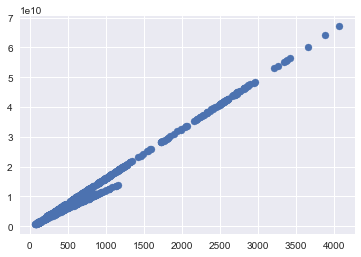

In [584]:
plt.scatter(df_table['Open'], df_table['Market_Cap'])

0    67112300000
1    64034100000
2    60242100000
3    55668000000
4    55134700000
Name: Market_Cap, dtype: object

## Hvis alt dette skal laves i én funktion:

In [343]:
base_url = "https://coinmarketcap.com/all/views/all"
response = requests.get(base_url).text
response

'<!DOCTYPE html>\n<!--[if lt IE 7]>      <html class="no-js lt-ie9 lt-ie8 lt-ie7"> <![endif]-->\n<!--[if IE 7]>         <html class="no-js lt-ie9 lt-ie8"> <![endif]-->\n<!--[if IE 8]>         <html class="no-js lt-ie9"> <![endif]-->\n<!--[if gt IE 8]><!--> \n<html class="no-js"> <!--<![endif]-->\n    <head>\n        <title>\n     All Currencies  | CryptoCurrency Market Capitalizations\n</title>\n        \n        <meta charset="utf-8" />\n        <meta name="viewport" content="width=device-width, initial-scale=1.0" />        \n        <meta name="google-site-verification" content="EDc1reqlQ-zAgeRrrgAxRXNK-Zs9JgpE9a0wdaoSO9A" />\n        <meta property="og:type" content="website" />\n        <meta property="og:image:type" content="image/png" />\n        <meta property="og:image:width" content="200" />\n        <meta property="og:image:height" content="200" />\n        \n        <meta property="og:image" content="http://coinmarketcap.com/static/img/CoinMarketCap.png" />\n        <meta pr

In [344]:
base_url

'https://coinmarketcap.com/all/views/all'

In [345]:
BeautifulSoup(response, "lxml")

<!DOCTYPE html>
<!--[if lt IE 7]>      <html class="no-js lt-ie9 lt-ie8 lt-ie7"> <![endif]--><!--[if IE 7]>         <html class="no-js lt-ie9 lt-ie8"> <![endif]--><!--[if IE 8]>         <html class="no-js lt-ie9"> <![endif]--><!--[if gt IE 8]><!--><html class="no-js"> <!--<![endif]-->
<head>
<title>
     All Currencies  | CryptoCurrency Market Capitalizations
</title>
<meta charset="utf-8"/>
<meta content="width=device-width, initial-scale=1.0" name="viewport"/>
<meta content="EDc1reqlQ-zAgeRrrgAxRXNK-Zs9JgpE9a0wdaoSO9A" name="google-site-verification"/>
<meta content="website" property="og:type"/>
<meta content="image/png" property="og:image:type"/>
<meta content="200" property="og:image:width"/>
<meta content="200" property="og:image:height"/>
<meta content="http://coinmarketcap.com/static/img/CoinMarketCap.png" property="og:image"/>
<meta content="https://coinmarketcap.com/static/img/CoinMarketCap.png" property="og:image:secure_url"/>
<meta content="CryptoCurrency Market Capitalizat

In [377]:
def scrape(response, base_url):
    data = BeautifulSoup(response, "lxml")
    investigators = data.findAll("td", {'class': 'no-wrap currency-name'})
    data4 = []
    for investigator in investigators:
        link = []
        link = base_url + investigator.a['href']
        data4.append(link)
    return data4

In [378]:
data

<!DOCTYPE html>
<!--[if lt IE 7]>      <html class="no-js lt-ie9 lt-ie8 lt-ie7"> <![endif]--><!--[if IE 7]>         <html class="no-js lt-ie9 lt-ie8"> <![endif]--><!--[if IE 8]>         <html class="no-js lt-ie9"> <![endif]--><!--[if gt IE 8]><!--><html class="no-js"> <!--<![endif]-->
<head>
<title>
     All Currencies  | CryptoCurrency Market Capitalizations
</title>
<meta charset="utf-8"/>
<meta content="width=device-width, initial-scale=1.0" name="viewport"/>
<meta content="EDc1reqlQ-zAgeRrrgAxRXNK-Zs9JgpE9a0wdaoSO9A" name="google-site-verification"/>
<meta content="website" property="og:type"/>
<meta content="image/png" property="og:image:type"/>
<meta content="200" property="og:image:width"/>
<meta content="200" property="og:image:height"/>
<meta content="http://coinmarketcap.com/static/img/CoinMarketCap.png" property="og:image"/>
<meta content="https://coinmarketcap.com/static/img/CoinMarketCap.png" property="og:image:secure_url"/>
<meta content="CryptoCurrency Market Capitalizat

In [379]:
investigators

NameError: name 'investigators' is not defined